<div align="center">

  <a href="https://ultralytics.com/yolov5" target="_blank">
    <img width="1024", src="https://raw.githubusercontent.com/ultralytics/assets/main/yolov5/v70/splash.png"></a>


<br>
  <a href="https://bit.ly/yolov5-paperspace-notebook"><img src="https://assets.paperspace.io/img/gradient-badge.svg" alt="Run on Gradient"></a>
  <a href="https://colab.research.google.com/github/ultralytics/yolov5/blob/master/tutorial.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"></a>
  <a href="https://www.kaggle.com/ultralytics/yolov5"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" alt="Open In Kaggle"></a>
<br>

This <a href="https://github.com/ultralytics/yolov5">YOLOv5</a> 🚀 notebook by <a href="https://ultralytics.com">Ultralytics</a> presents simple train, validate and predict examples to help start your AI adventure.<br>We hope that the resources in this notebook will help you get the most out of YOLOv5. Please browse the YOLOv5 <a href="https://docs.ultralytics.com/yolov5">Docs</a> for details, raise an issue on <a href="https://github.com/ultralytics/yolov5">GitHub</a> for support, and join our <a href="https://discord.gg/n6cFeSPZdD">Discord</a> community for questions and discussions!

</div>

# Setup

Clone GitHub [repository](https://github.com/ultralytics/yolov5), install [dependencies](https://github.com/ultralytics/yolov5/blob/master/requirements.txt) and check PyTorch and GPU.

### path setup paperspace

In [9]:
HOME = '/mnt/d/LocalGit/NTNU_mscThesis'
STORAGE = HOME+'/datasets/rebalanced_2x2_train-val-OGtest.yolov5/'
%cd {HOME}
%cd {STORAGE}

/mnt/d/LocalGit/NTNU_mscThesis
/mnt/d/LocalGit/NTNU_mscThesis/datasets/rebalanced_2x2_train-val-OGtest.yolov5


In [ ]:
# !git clone https://github.com/ultralytics/yolov5  # clone
# %cd yolov5
# %pip install -qr requirements.txt  # install
# !pip install -U albumentations

# 1. Detect (Sanity check if its working)

`detect.py` runs YOLOv5 inference on a variety of sources, downloading models automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases), and saving results to `runs/detect`. Example inference sources are:

```shell
python detect.py --source 0  # webcam
                          img.jpg  # image 
                          vid.mp4  # video
                          screen  # screenshot
                          path/  # directory
                         'path/*.jpg'  # glob
                         'https://youtu.be/Zgi9g1ksQHc'  # YouTube
                         'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

In [29]:
image_name = "1845_jpg.rf.17d7d412103355e9f61dc8d4fdf15066.jpg"
image_path = STORAGE+"/test/images/"+image_name

Using cache found in /home/skb/.cache/torch/hub/ultralytics_yolov5_master


requirements: /home/skb/miniconda3/envs/yolov5/lib/python3.11/site-packages/requirements.txt not found, check failed.


YOLOv5 🚀 v7.0-173-g5733342 Python-3.11.3 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)

Fusing layers... 
Model summary: 182 layers, 7257306 parameters, 0 gradients
Adding AutoShape... 
image 1/1: 5456x3632 2 boats, 2 swimmers
Speed: 143.5ms pre-process, 71.2ms inference, 11.0ms NMS per image at shape (1, 3, 640, 448)


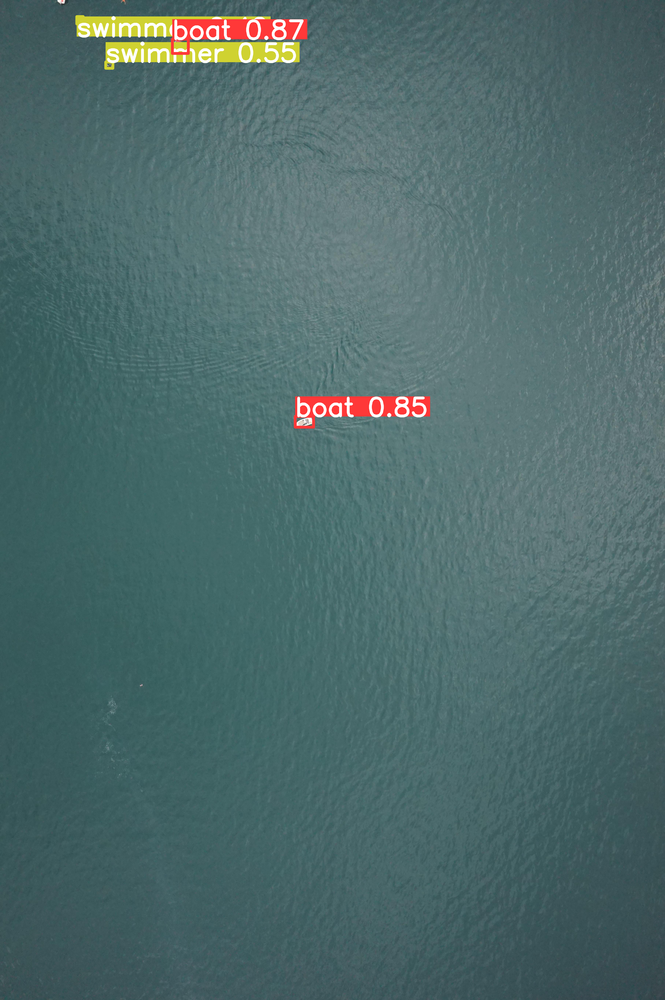

In [30]:
# %cd {HOME}/yolov5
model_path = str(HOME+'/yolov5_200epocs/runs/train/yolov5s_b96_results/weights/best.pt')
# !python detect.py --weights model_path --img 1900 --conf 0.25 --source image_path

# YOLOv5 PyTorch HUB Inference (DetectionModels only)
import torch

model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path)  # yolov5n - yolov5x6 or custom
# im = 'https://ultralytics.com/images/zidane.jpg'  # file, Path, PIL.Image, OpenCV, nparray, list
model.conf = 0.40  # NMS confidence threshold
model.iou = 0.45  # NMS IoU threshold
model.agnostic = False  # NMS class-agnostic
model.multi_label = False  # NMS multiple labels per box
# model.classes = None  # (optional list) filter by class, i.e. = [0, 15, 16] for COCO persons, cats and dogs
# model.max_det = 1000  # maximum number of detections per image
# model.amp = False  # Automatic Mixed Precision (AMP) inference


results = model(image_path, size=640)  # inference
results.print()  # or .show(), .save(), .crop(), .pandas(), etc.
results.show() 

# Appendix

Additional content below.

In [31]:
# # YOLOv5 PyTorch HUB Inference (DetectionModels only)
# import torch

# model = torch.hub.load('ultralytics/yolov5', 'yolov5s', force_reload=True)  # yolov5n - yolov5x6 or custom
# im = 'https://ultralytics.com/images/zidane.jpg'  # file, Path, PIL.Image, OpenCV, nparray, list
# results = model(im)  # inference
# results.print()  # or .show(), .save(), .crop(), .pandas(), etc.